<a href="https://colab.research.google.com/github/TheClub4/IMDB_Sentiment_Analysis/blob/master/IMDB_SentimentAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <font color='greyblue'>Logistic Regression: A Sentimental Analysis Case Study</font>

## Task 1: Loading the dataset
_______

In [21]:
import pandas as pd
df = pd.read_csv('RateMyProfessor_Sample data.csv')


df.head(10)

,rating,review
0,4.7,"This class is hard, but its a two-in-one gen-e..."
1,4.7,Definitely going to choose Prof. Looney\'s cla...
2,4.7,I overall enjoyed this class because the assig...
3,4.7,"Yes, it\'s possible to get an A but you\'ll de..."
4,4.7,Professor Looney has great knowledge in Astron...
5,4.7,Looney is a super funny guy and this class was...
6,4.7,Professor Looney is the BOMB. He is a truly go...
7,4.7,Professor Leslie Looney is honestly amazing. I...
8,4.7,Looney is a beast. Best prof on campus and thi...
9,4.7,"The homework, exams, and lab could trip you up..."


In [3]:
df.head(10)

,sentiment,review
0,4.7,"This class is hard, but its a two-in-one gen-e..."
1,4.7,Definitely going to choose Prof. Looney\'s cla...
2,4.7,I overall enjoyed this class because the assig...
3,4.7,"Yes, it\'s possible to get an A but you\'ll de..."
4,4.7,Professor Looney has great knowledge in Astron...
5,4.7,Looney is a super funny guy and this class was...
6,4.7,Professor Looney is the BOMB. He is a truly go...
7,4.7,Professor Leslie Looney is honestly amazing. I...
8,4.7,Looney is a beast. Best prof on campus and thi...
9,4.7,"The homework, exams, and lab could trip you up..."


In [4]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer

count = CountVectorizer()
docs = (['The sun is shining',
         'The weather is sweet',
         'The sun is shining, the weather is sweet, and one and one is two'])
bag = count.fit_transform(docs)

print(count.vocabulary_)
print(bag.toarray())

{'the': 6, 'sun': 4, 'is': 1, 'shining': 3, 'weather': 8, 'sweet': 5, 'and': 0, 'one': 2, 'two': 7}
[[0 1 0 1 1 0 1 0 0]
 [0 1 0 0 0 1 1 0 1]
 [2 3 2 1 1 1 2 1 1]]


In [5]:
from sklearn.feature_extraction.text import TfidfTransformer
np.set_printoptions(precision=2)

tfidf = TfidfTransformer(use_idf=True, norm='l2', smooth_idf=True)

print(tfidf.fit_transform(bag).toarray())

[[0.   0.43 0.   0.56 0.56 0.   0.43 0.   0.  ]
 [0.   0.43 0.   0.   0.   0.56 0.43 0.   0.56]
 [0.5  0.45 0.5  0.19 0.19 0.19 0.3  0.25 0.19]]


# Task 2: Data Cleaning
___

In [18]:
import re
def preprocessor(text):
  if isinstance(text, str):
    text =re.sub('<[^>]*>', '', text)
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', text)
    text = re.sub('[\W]+', ' ', text.lower()) + ' '.join(emoticons).replace('-', '')
  
    return text

  return ""

preprocessor("This is a :) test :-( !")

'this is a test :) :('

In [22]:
# Alter values in sentiment column to 1 and 0 if they are greater than 3.7 and less than 3.7 respectively
df['sentiment'] = np.where(df['rating'] > 3.7, 1, 0)

df.head(10)

,rating,review,sentiment
0,4.7,"This class is hard, but its a two-in-one gen-e...",1
1,4.7,Definitely going to choose Prof. Looney\'s cla...,1
2,4.7,I overall enjoyed this class because the assig...,1
3,4.7,"Yes, it\'s possible to get an A but you\'ll de...",1
4,4.7,Professor Looney has great knowledge in Astron...,1
5,4.7,Looney is a super funny guy and this class was...,1
6,4.7,Professor Looney is the BOMB. He is a truly go...,1
7,4.7,Professor Leslie Looney is honestly amazing. I...,1
8,4.7,Looney is a beast. Best prof on campus and thi...,1
9,4.7,"The homework, exams, and lab could trip you up...",1


In [23]:
# Apply preprocessor function to the review column
df['review'] = df['review'].apply(preprocessor)

df.head(10)

,rating,review,sentiment
0,4.7,this class is hard but its a two in one gen ed...,1
1,4.7,definitely going to choose prof looney s class...,1
2,4.7,i overall enjoyed this class because the assig...,1
3,4.7,yes it s possible to get an a but you ll defin...,1
4,4.7,professor looney has great knowledge in astron...,1
5,4.7,looney is a super funny guy and this class was...,1
6,4.7,professor looney is the bomb he is a truly goo...,1
7,4.7,professor leslie looney is honestly amazing i ...,1
8,4.7,looney is a beast best prof on campus and this...,1
9,4.7,the homework exams and lab could trip you up i...,1


# Task 3: Tokenization
___

In [24]:
from nltk.stem.porter import PorterStemmer

porter = PorterStemmer()

def tokenizer(text):
  return text.split()

def tokenizer_stemmer(text):
  return[porter.stem(word) for word in text.split()]

tokenizer('runners like running thus they run')

['runners', 'like', 'running', 'thus', 'they', 'run']

In [90]:
tokenizer_stemmer('runners like running thus they run')

['runner', 'like', 'run', 'thu', 'they', 'run']

In [25]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /home/enzo/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [26]:
from nltk.corpus import stopwords

stop = stopwords.words('english')
[w for w in tokenizer_stemmer('runners like running thus they run') if w not in stop]

['runner', 'like', 'run', 'thu', 'run']

# Task 4: Transform Text Data into TF-IDF Vectors
___

In [27]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(strip_accents=None,
                         lowercase=True,
                         preprocessor=None,  # applied preprocessor in Data Cleaning
                         tokenizer=tokenizer_stemmer,
                         use_idf=True,
                         norm='l2',
                         smooth_idf=True)

y = df.sentiment.values
X = tfidf.fit_transform(df.review)

/home/enzo/.local/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [29]:
X

<20000x11921 sparse matrix of type '<class 'numpy.float64'>'
	with 612625 stored elements in Compressed Sparse Row format>

# Task 5: Document Classification using Logistic Regression
___

In [28]:
from sklearn.model_selection import train_test_split
import pickle
from sklearn.linear_model import LogisticRegressionCV


X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, test_size=0.5, shuffle=False)

clf = LogisticRegressionCV(cv=5,
                           scoring='accuracy',
                           random_state=0,
                           n_jobs=-1,
                           verbose=3,
                           max_iter=300).fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11922     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.54518D+03    |proj g|=  1.45000D+02


ITERATION     1

---------------- CAUCHY entered-------------------
 There are            0   breakpoints 

 GCP found in this segment
Piece      1 --f1, f2 at start point  -4.0193D+04  4.0193D+04
Distance to the stationary point =   1.0000D+00

---------------- exit CAUCHY----------------------

       11922  variables are free at GCP            1
 LINE SEARCH           1  times; norm of step =    3.3152344037419075E-002

At iterate    1    f=  5.54184D+03    |proj g|=  9.26988D+01


ITERATION     2

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    1.8637542244077338E-002

At iterate    2    f=  5.54016D+03    |proj g|=  5.78564D+01


ITERATION     3

--------

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


-01
      0.0000D+00  2.2018D-03 -6.9938D-04  0.0000D+00 -7.8846D-04  0.0000D+00
     -2.2635D-02  0.0000D+00 -1.3496D-02  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00 -4.9725D-03  3.7560D-03  0.0000D+00 -3.0903D-02 -1.2974D-03
      1.4217D-03 -7.0427D-04  0.0000D+00  3.0158D-03  0.0000D+00  0.0000D+00
      7.2313D-03  4.1217D-02  1.5409D-02 -6.3722D-03  0.0000D+00 -3.8488D-03
      1.7209D-03  0.0000D+00  4.7837D-03  8.3555D-04  0.0000D+00  0.0000D+00
     -1.2828D-03  0.0000D+00  7.2938D-02  0.0000D+00 -3.8761D-02 -6.1220D-03
     -8.1892D-04  0.0000D+00 -8.9160D-04  0.0000D+00 -3.2311D-02 -8.2413D-04
      0.0000D+00  0.0000D+00  8.8755D-03  0.0000D+00 -3.6195D-03  0.0000D+00
      0.0000D+00 -2.2210D-02  0.0000D+00 -7.1672D-03  8.5994D-03 -1.7885D-02
     -7.4826D-04  0.0000D+00  0.0000D+00  9.5268D-04  0.0000D+00  8.5012D-04
      0.0000D+00  0.0000D+00  0.0000D+00  6.3036D-03 -4.6974D-03 -5.3611D-03
      0.0000D+00  1.2248D-03 -1.0494D-03 -3.4897D-04  1.2518D-03  1.0371

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



----------------SUBSM entered-----------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    5.2799368575427519E-003

At iterate   22    f=  4.83684D+03    |proj g|=  8.50001D-02

----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0.22253274390084735     

At iterate   26    f=  4.03420D+03    |proj g|=  2.75998D-01


ITERATION    23


ITERATION    27
 LINE SEARCH           0  times; norm of step =   0.45774341396971224     

At iterate   21    f=  3.99067D+03    |proj g|=  9.57886D-01

----------------SUBSM entered-----------------


----------------SUBSM entered-----------------



ITERATION    22

----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    1.4108804916155981     

At iterate   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



----------------SUBSM entered-----------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           1  times; norm of step =    2.2794513671059562     

At iterate   31    f=  2.97167D+03    |proj g|=  1.24291D+01
 LINE SEARCH           0  times; norm of step =   0.20749696795434322     

At iterate   56    f=  2.87038D+03    |proj g|=  3.47968D+00


ITERATION    32


ITERATION    57

----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =   0.23975215351157528     

At iterate   67    f=  2.87149D+03    |proj g|=  3.87511D+00
 LINE SEARCH           0  times; norm of step =   0.95938620750808146     

At iterate   48    f=  2.92637D+03    |proj g|=  9.46287D+00

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------



ITERATION    68

----------------exit SUBSM --------------------





 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.






ITERATION    24
ITERATION    54

----------------SUBSM entered-----------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    6.5950936971531604     

At iterate   32    f=  1.88698D+03    |proj g|=  6.58614D+00


ITERATION    33

----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =    3.1959147497672716E-002

At iterate  168    f=  2.91265D+03    |proj g|=  2.03739D-01
 LINE SEARCH           1  times; norm of step =   0.48873755644153916     

At iterate   37    f=  1.85511D+03    |proj g|=  2.12731D+00

----------------exit SUBSM --------------------



ITERATION    38


ITERATION   169
 LINE SEARCH           0  times; norm of step =   0.71628241530760728     

At iterate   54    f=  1.88556D+03    |proj g|=  1.19290D+01
 LINE SEARCH           0  times; norm of step =    5.100125096392

 This problem is unconstrained.



----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0.15732457055868262     

At iterate  176    f=  1.81626D+03    |proj g|=  2.19196D-01
 LINE SEARCH           1  times; norm of step =   0.65994642523606462     

At iterate  171    f=  1.81773D+03    |proj g|=  4.89409D+00


ITERATION   177


ITERATION   172

----------------SUBSM entered-----------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0.32382214464810455     

At iterate  163    f=  1.87051D+03    |proj g|=  1.39080D+00
 LINE SEARCH           0  times; norm of step =   0.32788340358892010     

At iterate  191    f=  1.85375D+03    |proj g|=  1.11060D+00


ITERATION   164
 

/home/enzo/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 This problem is unconstrained.
/home/enzo/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_


At iterate    8    f=  1.27970D+03    |proj g|=  1.55853D+01


ITERATION     9

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    7.7990720447827400     

At iterate   24    f=  1.23565D+03    |proj g|=  7.00519D+00


ITERATION    25
 LINE SEARCH           1  times; norm of step =   0.40032174517339786     

At iterate  132    f=  1.86254D+03    |proj g|=  7.16884D+00
 LINE SEARCH           0  times; norm of step =    5.5826582030594173E-002

At iterate  298    f=  1.86932D+03    |proj g|=  4.80073D-02

----------------SUBSM entered-----------------



ITERATION   299


ITERATION   133

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =    48.543206570017276     

At iterate    9    f=  1.25424D+03    |proj g|=  2.07956D+00

----------------exit 

/home/enzo/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 This problem is unconstrained.
 This problem is unconstrained.


+00  0.0000D+00 -5.9846D+00  0.0000D+00  2.9832D+00
      0.0000D+00  0.0000D+00  3.7754D+00  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  4.6082D-01  0.0000D+00
      1.0959D+01  9.5524D-01  3.2570D+00  1.9030D+00 -1.6785D+00  0.0000D+00
      0.0000D+00 -6.1680D+00  3.3988D+00  0.0000D+00 -3.5473D+00  0.0000D+00
     -1.9679D+00 -1.6977D+00  6.2105D+00  1.0615D+00  2.6994D+00  1.9300D+00
      0.0000D+00 -6.1989D+00  4.8423D+00 -6.1558D+00  0.0000D+00  0.0000D+00
      6.5250D+00  0.0000D+00  1.8974D+00  0.0000D+00 -4.1749D+00 -6.5525D+00
      0.0000D+00 -1.3108D+00 -4.4158D+00  0.0000D+00  0.0000D+00  3.6153D-01
     -5.1620D+00 -7.9727D+00  0.0000D+00  1.0083D+00  7.8214D+00  8.0563D+00
     -6.2362D+00  1.0275D+00  0.0000D+00  3.5724D+00  1.4127D+00  9.4360D+00
      1.9455D+00 -9.9723D-01 -2.0717D+00 -7.1960D+00 -2.8090D+00 -3.1925D-01
     -3.3122D+00 -2.1760D+00  0.0000D+00  0.0000D+00  1.1411D+01 -1.0045D-01
      0.0000D+00  9.0544

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



----------------SUBSM entered-----------------


----------------exit SUBSM --------------------

 LINE SEARCH           1  times; norm of step =   0.10345728091965919     

At iterate    3    f=  9.12739D+02    |proj g|=  8.78962D-01
 LINE SEARCH           0  times; norm of step =    2.3019639658579756     

At iterate  119    f=  1.19369D+03    |proj g|=  2.04454D+00


ITERATION     4

----------------SUBSM entered-----------------



ITERATION   120

----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    5.2872280774633325     

At iterate   35    f=  9.16761D+02    |proj g|=  9.92711D+00
 LINE SEARCH           0  times; norm of step =    11.362917092657366     

At iterate   22    f=  8.95346D+02    |proj g|=  4.65234D+00

----------------SUBSM entered-----------------



ITERATION    36


ITERATION    23

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered----

 This problem is unconstrained.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    4.5s remaining:    6.7s



----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    1.3796603900950899     

At iterate  220    f=  7.63538D+02    |proj g|=  1.53709D+00


ITERATION   221

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------

 LINE SEARCH           1  times; norm of step =    8.6289724645827359     

At iterate   53    f=  8.74935D+02    |proj g|=  4.29202D+00
 LINE SEARCH           0  times; norm of step =    2.0922005886666994     

At iterate  221    f=  7.63480D+02    |proj g|=  1.19340D+00


ITERATION    54


ITERATION   222

----------------SUBSM entered-----------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    2.4626690501268853     

At iterate  222    f=  7.63451D+02    |proj g|=  4.75971D+00


ITERATION   223

----------------SUBSM entered---

[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    5.0s finished
 This problem is unconstrained.



At iterate    1    f=  5.99265D+03    |proj g|=  5.22350D+01

At iterate    2    f=  5.99135D+03    |proj g|=  4.69496D+01

At iterate    3    f=  5.98553D+03    |proj g|=  2.15933D+00

At iterate    4    f=  5.98530D+03    |proj g|=  2.08664D+00

At iterate    5    f=  5.98371D+03    |proj g|=  6.93655D+00

At iterate    6    f=  5.98305D+03    |proj g|=  6.24425D+00

At iterate    7    f=  5.98284D+03    |proj g|=  4.42081D+00

At iterate    8    f=  5.98264D+03    |proj g|=  1.19274D+00

At iterate    9    f=  5.98258D+03    |proj g|=  9.08241D-01

At iterate   10    f=  5.98251D+03    |proj g|=  7.85491D-01

At iterate   11    f=  5.98245D+03    |proj g|=  5.32240D-01

At iterate   12    f=  5.98242D+03    |proj g|=  4.71721D-01

At iterate   13    f=  5.98242D+03    |proj g|=  2.23267D-01

At iterate   14    f=  5.98242D+03    |proj g|=  7.94614D-02

At iterate   15    f=  5.98242D+03    |proj g|=  1.27653D-01

At iterate   16    f=  5.98242D+03    |proj g|=  3.89845D-01

At iter

In [30]:
saved_model = open('saved_model.sav', 'wb')
pickle.dump(clf, saved_model)
saved_model.close()

# Task 6: Model Evaluation
___

In [31]:
filename = 'saved_model.sav'
saved_clf = pickle.load(open(filename, 'rb'))

In [32]:
clf.score(X_test, y_test)

0.6652

In [33]:
yhat = clf.predict(X_test)
yhat

array([0, 0, 0, ..., 1, 1, 1])

### Confusion matrix

In [35]:
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
print(confusion_matrix(y_test, yhat, labels=[1,0]))

[[3032 2138]
 [1210 3620]]


Confusion matrix, without normalization
[[3032 2138]
 [1210 3620]]


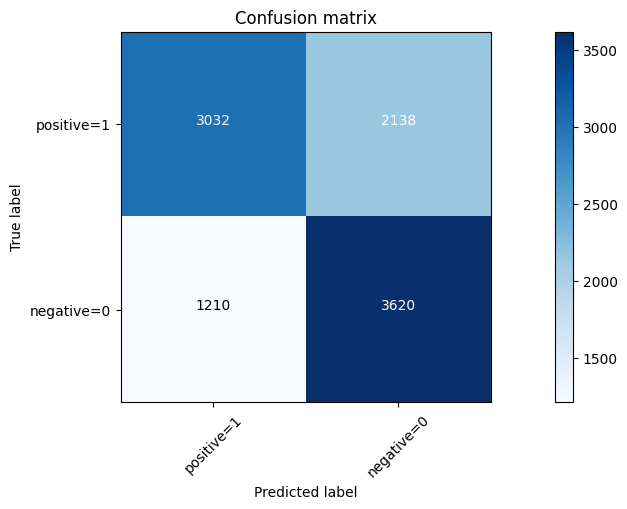

In [36]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, yhat, labels=[1,0])
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plt.figure(figsize=(13,5))
plot_confusion_matrix(cnf_matrix, classes=['positive=1','negative=0'],normalize= False,  title='Confusion matrix')